In [1]:
import mmcv
from mmcv.runner import load_checkpoint

from mmdet.apis import inference_detector, show_result_pyplot
from mmdet.models import build_detector
import matplotlib.pyplot as plt

In [2]:
import json 

with open('openlogo_coco/test_coco.json') as json_file:
    data = json.load(json_file)

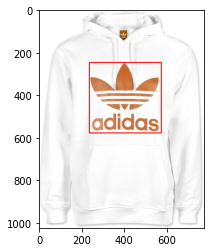

In [3]:
%matplotlib inline

## проверим, что все ок 
import cv2
from matplotlib import pyplot as plt
anno = data['annotations'][88]
bbox = anno['bbox']

image = data['images'][anno['image_id']]
file_name = image['file_name']




img = cv2.imread('openlogo_coco/JPEGImages/' + file_name)

pt1 = (bbox[0], bbox[1])
pt2 = (bbox[0] + bbox[2], bbox[1] + bbox[3])

img = cv2.rectangle(img, pt1, pt2, (255, 0, 0), 3)
# img = cv2.resize(img, (640, 640))
plt.imshow(img)

In [4]:
# !wget https://download.openmmlab.com/mmdetection/v2.0/yolox/yolox_tiny_8x8_300e_coco/yolox_tiny_8x8_300e_coco_20211124_171234-b4047906.pth 

In [11]:
from mmdet.apis import set_random_seed
from mmcv import Config

cfg = Config.fromfile('mmdetection/configs/yolox/yolox_tiny_8x8_300e_coco.py')

classes = ['logo']
# Modify dataset type and path
cfg.dataset_type = 'CocoDataset'
cfg.data.samples_per_gpu = 16

cfg.data.test.type = 'CocoDataset'
cfg.data.test.data_root = 'openlogo_coco/'
cfg.data.test.ann_file = 'test_coco.json'
cfg.data.test.img_prefix = 'JPEGImages'
cfg.data.test.classes = classes

cfg.data.train.dataset.type = 'CocoDataset'
cfg.data.train.dataset.data_root = 'openlogo_coco/'
cfg.data.train.dataset.ann_file = 'train_coco.json'
cfg.data.train.dataset.img_prefix = 'JPEGImages'
cfg.data.train.dataset.classes = classes

cfg.data.val.type = 'CocoDataset'
cfg.data.val.data_root = 'openlogo_coco/'
cfg.data.val.ann_file = 'test_coco.json'
cfg.data.val.img_prefix = 'JPEGImages'
cfg.data.val.classes = classes

# cfg.load_from = 'yolox_tiny_8x8_300e_coco_20211124_171234-b4047906.pth'
cfg.resume_from = 'logs/epoch_100.pth'
cfg.runner.max_epochs = 200

cfg.data.workers_per_gpu = 1
cfg.opencv_num_threads = 2

cfg.model.bbox_head.num_classes = 1 
cfg.work_dir = './logs'

cfg.log_config.interval = 587

cfg.evaluation.metric = 'bbox'
cfg.evaluation.interval = 10
cfg.checkpoint_config.interval = 10

# Set seed thus the results are more reproducible
cfg.seed = 0
set_random_seed(0, deterministic=False)
cfg.gpu_ids = [0]
cfg.device = 'cuda'

# We can also use tensorboard to log the training process
cfg.log_config.hooks = [
    dict(type='TextLoggerHook'),
    dict(type='TensorboardLoggerHook')]


print(f'Config:\n{cfg.pretty_text}')
cfg.dump('cfg.py')

Config:
optimizer = dict(
    type='SGD',
    lr=0.01,
    momentum=0.9,
    weight_decay=0.0005,
    nesterov=True,
    paramwise_cfg=dict(norm_decay_mult=0.0, bias_decay_mult=0.0))
optimizer_config = dict(grad_clip=None)
lr_config = dict(
    policy='YOLOX',
    warmup='exp',
    by_epoch=False,
    warmup_by_epoch=True,
    warmup_ratio=1,
    warmup_iters=5,
    num_last_epochs=15,
    min_lr_ratio=0.05)
runner = dict(type='EpochBasedRunner', max_epochs=200)
checkpoint_config = dict(interval=10)
log_config = dict(
    interval=587,
    hooks=[dict(type='TextLoggerHook'),
           dict(type='TensorboardLoggerHook')])
custom_hooks = [
    dict(type='YOLOXModeSwitchHook', num_last_epochs=15, priority=48),
    dict(type='SyncNormHook', num_last_epochs=15, interval=10, priority=48),
    dict(
        type='ExpMomentumEMAHook',
        resume_from=None,
        momentum=0.0001,
        priority=49)
]
dist_params = dict(backend='nccl')
log_level = 'INFO'
load_from = None
resume_from = '

In [12]:
from mmdet.datasets import build_dataset
from mmdet.models import build_detector
from mmdet.apis import train_detector
import os.path as osp

# Build dataset
datasets = [build_dataset(cfg.data.train)]

# Build the detector
model = build_detector(cfg.model)
# Add an attribute for visualization convenience
model.CLASSES = datasets[0].CLASSES

# Create work_dir
mmcv.mkdir_or_exist(osp.abspath(cfg.work_dir))
train_detector(model, datasets, cfg, distributed=False, validate=True)

loading annotations into memory...
Done (t=0.17s)
creating index...
index created!


2022-07-23 05:06:06,304 - mmdet - INFO - Automatic scaling of learning rate (LR) has been disabled.
2022-07-23 05:06:06,440 - mmdet - INFO - load checkpoint from local path: logs/epoch_100.pth


loading annotations into memory...
Done (t=0.10s)
creating index...
index created!


2022-07-23 05:06:06,527 - mmdet - WARNING - The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_stem_conv_conv_weight, ema_backbone_stem_conv_bn_weight, ema_backbone_stem_conv_bn_bias, ema_backbone_stem_conv_bn_running_mean, ema_backbone_stem_conv_bn_running_var, ema_backbone_stem_conv_bn_num_batches_tracked, ema_backbone_stage1_0_conv_weight, ema_backbone_stage1_0_bn_weight, ema_backbone_stage1_0_bn_bias, ema_backbone_stage1_0_bn_running_mean, ema_backbone_stage1_0_bn_running_var, ema_backbone_stage1_0_bn_num_batches_tracked, ema_backbone_stage1_1_main_conv_conv_weight, ema_backbone_stage1_1_main_conv_bn_weight, ema_backbone_stage1_1_main_conv_bn_bias, ema_backbone_stage1_1_main_conv_bn_running_mean, ema_backbone_stage1_1_main_conv_bn_running_var, ema_backbone_stage1_1_main_conv_bn_num_batches_tracked, ema_backbone_stage1_1_short_conv_conv_weight, ema_backbone_stage1_1_short_conv_bn_weight, ema_backbone_stage1_1_short_conv_bn_bias, e

2022-07-23 05:06:06,535 - mmdet - INFO - resumed epoch 100, iter 117300
2022-07-23 05:06:06,536 - mmdet - INFO - Start running, host: root@pekhorka, work_dir: /root/logs
2022-07-23 05:06:06,537 - mmdet - INFO - Hooks will be executed in the following order:
before_run:
(VERY_HIGH   ) YOLOXLrUpdaterHook                 
(49          ) ExpMomentumEMAHook                 
(NORMAL      ) CheckpointHook                     
(LOW         ) EvalHook                           
(VERY_LOW    ) TextLoggerHook                     
(VERY_LOW    ) TensorboardLoggerHook              
 -------------------- 
before_train_epoch:
(VERY_HIGH   ) YOLOXLrUpdaterHook                 
(48          ) YOLOXModeSwitchHook                
(48          ) SyncNormHook                       
(49          ) ExpMomentumEMAHook                 
(LOW         ) IterTimerHook                      
(LOW         ) EvalHook                           
(VERY_LOW    ) TextLoggerHook                     
(VERY_LOW    ) Tensorboa

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 8331/8331, 95.6 task/s, elapsed: 87s, ETA:     0s

2022-07-23 06:58:24,705 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.14s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=6.27s).
Accumulating evaluation results...


2022-07-23 06:58:32,359 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.432
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.669
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.483
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.212
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.421
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.596
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.553
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.554
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.554
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.348
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.560
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=1.09s).


2022-07-23 07:04:07,015 - mmdet - INFO - Epoch [111][587/1173]	lr: 3.981e-03, eta: 8:40:49, time: 0.570, data_time: 0.321, memory: 6036, loss_cls: 0.5100, loss_bbox: 1.9076, loss_obj: 1.6728, loss: 4.0905
2022-07-23 07:15:13,532 - mmdet - INFO - Epoch [112][587/1173]	lr: 3.901e-03, eta: 8:33:20, time: 0.573, data_time: 0.323, memory: 6036, loss_cls: 0.5083, loss_bbox: 1.9010, loss_obj: 1.6647, loss: 4.0740
2022-07-23 07:26:22,050 - mmdet - INFO - Epoch [113][587/1173]	lr: 3.822e-03, eta: 8:25:51, time: 0.568, data_time: 0.315, memory: 6080, loss_cls: 0.5070, loss_bbox: 1.8941, loss_obj: 1.6586, loss: 4.0597
2022-07-23 07:37:22,377 - mmdet - INFO - Epoch [114][587/1173]	lr: 3.743e-03, eta: 8:18:27, time: 0.565, data_time: 0.313, memory: 6080, loss_cls: 0.5062, loss_bbox: 1.8890, loss_obj: 1.6391, loss: 4.0344
2022-07-23 07:48:36,606 - mmdet - INFO - Epoch [115][587/1173]	lr: 3.664e-03, eta: 8:11:37, time: 0.571, data_time: 0.335, memory: 6080, loss_cls: 0.5086, loss_bbox: 1.9053, loss_o

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 8331/8331, 94.1 task/s, elapsed: 89s, ETA:     0s

2022-07-23 08:51:16,961 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.05s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=6.61s).
Accumulating evaluation results...


2022-07-23 08:51:25,096 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.424
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.668
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.471
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.209
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.412
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.584
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.548
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.548
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.548
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.344
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.554
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=1.20s).


2022-07-23 08:56:57,356 - mmdet - INFO - Epoch [121][587/1173]	lr: 3.205e-03, eta: 7:33:11, time: 0.566, data_time: 0.322, memory: 6080, loss_cls: 0.5018, loss_bbox: 1.8638, loss_obj: 1.5982, loss: 3.9638
2022-07-23 09:08:06,636 - mmdet - INFO - Epoch [122][587/1173]	lr: 3.131e-03, eta: 7:27:06, time: 0.572, data_time: 0.330, memory: 6080, loss_cls: 0.5035, loss_bbox: 1.8701, loss_obj: 1.5876, loss: 3.9612
2022-07-23 09:19:13,545 - mmdet - INFO - Epoch [123][587/1173]	lr: 3.057e-03, eta: 7:21:00, time: 0.570, data_time: 0.335, memory: 6080, loss_cls: 0.5014, loss_bbox: 1.8652, loss_obj: 1.5838, loss: 3.9505
2022-07-23 09:30:21,191 - mmdet - INFO - Epoch [124][587/1173]	lr: 2.983e-03, eta: 7:14:59, time: 0.571, data_time: 0.329, memory: 6080, loss_cls: 0.5006, loss_bbox: 1.8596, loss_obj: 1.5722, loss: 3.9324
2022-07-23 09:41:28,123 - mmdet - INFO - Epoch [125][587/1173]	lr: 2.911e-03, eta: 7:08:55, time: 0.569, data_time: 0.325, memory: 6080, loss_cls: 0.5017, loss_bbox: 1.8619, loss_o

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 8331/8331, 94.2 task/s, elapsed: 88s, ETA:     0s

2022-07-23 10:44:10,728 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.15s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=6.71s).
Accumulating evaluation results...


2022-07-23 10:44:19,080 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.426
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.671
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.474
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.212
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.415
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.585
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.549
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.549
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.549
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.347
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.555
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=1.23s).


2022-07-23 10:49:53,537 - mmdet - INFO - Epoch [131][587/1173]	lr: 2.492e-03, eta: 6:33:32, time: 0.570, data_time: 0.323, memory: 6090, loss_cls: 0.4938, loss_bbox: 1.8190, loss_obj: 1.5207, loss: 3.8335
2022-07-23 11:00:56,035 - mmdet - INFO - Epoch [132][587/1173]	lr: 2.425e-03, eta: 6:27:31, time: 0.562, data_time: 0.305, memory: 6090, loss_cls: 0.4892, loss_bbox: 1.7898, loss_obj: 1.4746, loss: 3.7536
2022-07-23 11:12:07,837 - mmdet - INFO - Epoch [133][587/1173]	lr: 2.358e-03, eta: 6:21:50, time: 0.577, data_time: 0.324, memory: 6090, loss_cls: 0.4896, loss_bbox: 1.7925, loss_obj: 1.4598, loss: 3.7419
2022-07-23 11:23:14,605 - mmdet - INFO - Epoch [134][587/1173]	lr: 2.293e-03, eta: 6:16:02, time: 0.571, data_time: 0.327, memory: 6090, loss_cls: 0.4911, loss_bbox: 1.8022, loss_obj: 1.4636, loss: 3.7569
2022-07-23 11:34:26,495 - mmdet - INFO - Epoch [135][587/1173]	lr: 2.229e-03, eta: 6:10:20, time: 0.576, data_time: 0.316, memory: 6090, loss_cls: 0.4865, loss_bbox: 1.7739, loss_o

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 8331/8331, 94.2 task/s, elapsed: 88s, ETA:     0s

2022-07-23 12:37:08,792 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.14s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=6.52s).
Accumulating evaluation results...


2022-07-23 12:37:16,901 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.431
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.675
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.482
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.216
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.420
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.591
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.552
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.552
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.552
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.350
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.558
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=1.18s).


2022-07-23 12:42:48,312 - mmdet - INFO - Epoch [141][587/1173]	lr: 1.862e-03, eta: 5:35:52, time: 0.564, data_time: 0.322, memory: 6090, loss_cls: 0.4854, loss_bbox: 1.7769, loss_obj: 1.4195, loss: 3.6818
2022-07-23 12:53:59,445 - mmdet - INFO - Epoch [142][587/1173]	lr: 1.804e-03, eta: 5:30:11, time: 0.574, data_time: 0.335, memory: 6090, loss_cls: 0.4812, loss_bbox: 1.7528, loss_obj: 1.4031, loss: 3.6370
2022-07-23 13:05:03,722 - mmdet - INFO - Epoch [143][587/1173]	lr: 1.748e-03, eta: 5:24:26, time: 0.569, data_time: 0.322, memory: 6090, loss_cls: 0.4816, loss_bbox: 1.7525, loss_obj: 1.3674, loss: 3.6016
2022-07-23 13:16:05,966 - mmdet - INFO - Epoch [144][587/1173]	lr: 1.692e-03, eta: 5:18:37, time: 0.563, data_time: 0.311, memory: 6090, loss_cls: 0.4818, loss_bbox: 1.7524, loss_obj: 1.3774, loss: 3.6117
2022-07-23 13:27:14,526 - mmdet - INFO - Epoch [145][587/1173]	lr: 1.638e-03, eta: 5:12:52, time: 0.568, data_time: 0.316, memory: 6090, loss_cls: 0.4782, loss_bbox: 1.7295, loss_o

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 8331/8331, 93.8 task/s, elapsed: 89s, ETA:     0s

2022-07-23 14:29:52,199 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.14s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=6.42s).
Accumulating evaluation results...


2022-07-23 14:30:00,151 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.434
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.677
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.485
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.217
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.423
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.594
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.553
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.553
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.553
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.352
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.558
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=1.14s).


2022-07-23 14:35:37,088 - mmdet - INFO - Epoch [151][587/1173]	lr: 1.335e-03, eta: 4:38:46, time: 0.574, data_time: 0.336, memory: 6093, loss_cls: 0.4739, loss_bbox: 1.7115, loss_obj: 1.3184, loss: 3.5038
2022-07-23 14:46:44,566 - mmdet - INFO - Epoch [152][587/1173]	lr: 1.289e-03, eta: 4:33:06, time: 0.571, data_time: 0.329, memory: 6093, loss_cls: 0.4734, loss_bbox: 1.7094, loss_obj: 1.2979, loss: 3.4807
2022-07-23 14:57:59,330 - mmdet - INFO - Epoch [153][587/1173]	lr: 1.244e-03, eta: 4:27:28, time: 0.577, data_time: 0.343, memory: 6093, loss_cls: 0.4741, loss_bbox: 1.7160, loss_obj: 1.2939, loss: 3.4839
2022-07-23 15:09:14,570 - mmdet - INFO - Epoch [154][587/1173]	lr: 1.200e-03, eta: 4:21:51, time: 0.576, data_time: 0.300, memory: 6093, loss_cls: 0.4702, loss_bbox: 1.6876, loss_obj: 1.2702, loss: 3.4281
2022-07-23 15:20:27,284 - mmdet - INFO - Epoch [155][587/1173]	lr: 1.157e-03, eta: 4:16:10, time: 0.570, data_time: 0.329, memory: 6093, loss_cls: 0.4711, loss_bbox: 1.6963, loss_o

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 8331/8331, 93.4 task/s, elapsed: 89s, ETA:     0s

2022-07-23 16:23:29,804 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.13s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=6.23s).
Accumulating evaluation results...


2022-07-23 16:23:37,398 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.435
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.676
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.486
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.219
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.424
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.595
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.552
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.552
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.552
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.354
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.557
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=1.08s).


2022-07-23 16:29:14,518 - mmdet - INFO - Epoch [161][587/1173]	lr: 9.277e-04, eta: 3:42:20, time: 0.574, data_time: 0.339, memory: 6093, loss_cls: 0.4684, loss_bbox: 1.6883, loss_obj: 1.2305, loss: 3.3872
2022-07-23 16:40:29,083 - mmdet - INFO - Epoch [162][587/1173]	lr: 8.940e-04, eta: 3:36:42, time: 0.575, data_time: 0.344, memory: 6093, loss_cls: 0.4662, loss_bbox: 1.6725, loss_obj: 1.2157, loss: 3.3544
2022-07-23 16:51:35,916 - mmdet - INFO - Epoch [163][587/1173]	lr: 8.616e-04, eta: 3:31:03, time: 0.572, data_time: 0.324, memory: 6093, loss_cls: 0.4660, loss_bbox: 1.6695, loss_obj: 1.2139, loss: 3.3493
2022-07-23 17:02:48,273 - mmdet - INFO - Epoch [164][587/1173]	lr: 8.305e-04, eta: 3:25:26, time: 0.577, data_time: 0.306, memory: 6093, loss_cls: 0.4598, loss_bbox: 1.6353, loss_obj: 1.1794, loss: 3.2744
2022-07-23 17:13:51,929 - mmdet - INFO - Epoch [165][587/1173]	lr: 8.008e-04, eta: 3:19:48, time: 0.574, data_time: 0.323, memory: 6093, loss_cls: 0.4610, loss_bbox: 1.6455, loss_o

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 8331/8331, 94.2 task/s, elapsed: 88s, ETA:     0s

2022-07-23 18:16:50,878 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=6.29s).
Accumulating evaluation results...


2022-07-23 18:16:58,517 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.436
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.677
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.488
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.217
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.426
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.596
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.551
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.551
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.551
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.350
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.556
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=1.06s).


2022-07-23 18:22:31,739 - mmdet - INFO - Epoch [171][587/1173]	lr: 6.513e-04, eta: 2:45:58, time: 0.568, data_time: 0.321, memory: 6093, loss_cls: 0.4596, loss_bbox: 1.6354, loss_obj: 1.1532, loss: 3.2482
2022-07-23 18:33:43,070 - mmdet - INFO - Epoch [172][587/1173]	lr: 6.312e-04, eta: 2:40:20, time: 0.574, data_time: 0.332, memory: 6093, loss_cls: 0.4595, loss_bbox: 1.6346, loss_obj: 1.1372, loss: 3.2313
2022-07-23 18:44:51,299 - mmdet - INFO - Epoch [173][587/1173]	lr: 6.126e-04, eta: 2:34:42, time: 0.573, data_time: 0.301, memory: 6093, loss_cls: 0.4553, loss_bbox: 1.6096, loss_obj: 1.1063, loss: 3.1713
2022-07-23 18:55:57,792 - mmdet - INFO - Epoch [174][587/1173]	lr: 5.954e-04, eta: 2:29:03, time: 0.568, data_time: 0.332, memory: 6093, loss_cls: 0.4584, loss_bbox: 1.6291, loss_obj: 1.1312, loss: 3.2186
2022-07-23 19:07:08,767 - mmdet - INFO - Epoch [175][587/1173]	lr: 5.795e-04, eta: 2:23:25, time: 0.572, data_time: 0.324, memory: 6093, loss_cls: 0.4588, loss_bbox: 1.6343, loss_o

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 8331/8331, 93.9 task/s, elapsed: 89s, ETA:     0s

2022-07-23 20:09:46,236 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=6.12s).
Accumulating evaluation results...


2022-07-23 20:09:53,674 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.434
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.672
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.485
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.216
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.425
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.594
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.548
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.548
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.548
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.348
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.555
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=1.04s).


2022-07-23 20:15:28,340 - mmdet - INFO - Epoch [181][587/1173]	lr: 5.146e-04, eta: 1:49:37, time: 0.570, data_time: 0.306, memory: 6093, loss_cls: 0.4526, loss_bbox: 1.5959, loss_obj: 1.1034, loss: 3.1519
2022-07-23 20:26:37,102 - mmdet - INFO - Epoch [182][587/1173]	lr: 5.089e-04, eta: 1:43:59, time: 0.574, data_time: 0.322, memory: 6093, loss_cls: 0.4562, loss_bbox: 1.6201, loss_obj: 1.1050, loss: 3.1813
2022-07-23 20:37:43,847 - mmdet - INFO - Epoch [183][587/1173]	lr: 5.045e-04, eta: 1:38:22, time: 0.573, data_time: 0.317, memory: 6093, loss_cls: 0.4526, loss_bbox: 1.5980, loss_obj: 1.0954, loss: 3.1459
2022-07-23 20:48:56,228 - mmdet - INFO - Epoch [184][587/1173]	lr: 5.016e-04, eta: 1:32:44, time: 0.569, data_time: 0.325, memory: 6093, loss_cls: 0.4539, loss_bbox: 1.6095, loss_obj: 1.1033, loss: 3.1667
2022-07-23 20:54:28,736 - mmdet - INFO - No mosaic and mixup aug now!
2022-07-23 20:54:28,763 - mmdet - INFO - Add additional L1 loss now!
2022-07-23 20:57:41,713 - mmdet - INFO - 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 8331/8331, 94.4 task/s, elapsed: 88s, ETA:     0s

2022-07-23 21:33:50,352 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.12s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=5.06s).
Accumulating evaluation results...


2022-07-23 21:33:56,430 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.453
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.676
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.508
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.224
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.441
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.624
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.558
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.558
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.558
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.347
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.561
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=0.79s).


2022-07-23 21:37:07,040 - mmdet - INFO - Epoch [191][587/1173]	lr: 5.000e-04, eta: 0:51:35, time: 0.324, data_time: 0.065, memory: 6093, loss_cls: 0.4175, loss_bbox: 1.4023, loss_obj: 0.7037, loss_l1: 0.3471, loss: 2.8706
2022-07-23 21:43:32,184 - mmdet - INFO - Epoch [192][587/1173]	lr: 5.000e-04, eta: 0:45:57, time: 0.330, data_time: 0.073, memory: 6093, loss_cls: 0.4183, loss_bbox: 1.4075, loss_obj: 0.7189, loss_l1: 0.3468, loss: 2.8916
2022-07-23 21:49:58,050 - mmdet - INFO - Epoch [193][587/1173]	lr: 5.000e-04, eta: 0:40:22, time: 0.323, data_time: 0.067, memory: 6093, loss_cls: 0.4155, loss_bbox: 1.3928, loss_obj: 0.6968, loss_l1: 0.3425, loss: 2.8476
2022-07-23 21:56:24,819 - mmdet - INFO - Epoch [194][587/1173]	lr: 5.000e-04, eta: 0:34:50, time: 0.331, data_time: 0.069, memory: 6093, loss_cls: 0.4144, loss_bbox: 1.3866, loss_obj: 0.6928, loss_l1: 0.3420, loss: 2.8358
2022-07-23 22:02:53,067 - mmdet - INFO - Epoch [195][587/1173]	lr: 5.000e-04, eta: 0:29:21, time: 0.337, data_ti

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 8331/8331, 95.4 task/s, elapsed: 87s, ETA:     0s

2022-07-23 22:39:42,917 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=4.51s).
Accumulating evaluation results...


2022-07-23 22:39:48,309 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.456
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.669
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.510
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.224
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.441
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.633
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.553
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.553
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.553
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.340
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.551
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=0.68s).


In [10]:
# load tensorboard in colab
%load_ext tensorboard

# see curves in tensorboard
%tensorboard --logdir ./logs --bind_all

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
import os 
from mmdet.apis import init_detector


model = build_detector(cfg.model )
model = init_detector(cfg, checkpoint='tutorial_exps/epoch_16.pth', device='cuda:0', cfg_options=None)
model.cfg = cfg
# Add an attribute for visualization convenience
model.CLASSES = datasets[0].CLASSES


load checkpoint from local path: tutorial_exps/epoch_16.pth


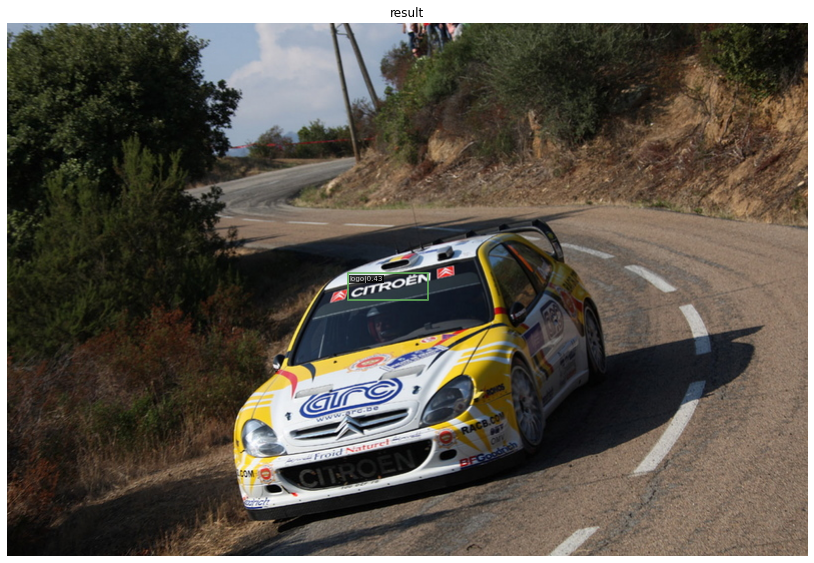

In [ ]:
img = mmcv.imread('openlogo_coco/JPEGImages/' + os.listdir('openlogo_coco/JPEGImages')[505])
result = inference_detector(model, img)
show_result_pyplot(model, img, result)

In [ ]:
!wget https://gdb.rferl.org/0ff60000-0aff-0242-8654-08da4c567444_w1200_r1.jpg

--2022-07-18 12:09:30--  https://gdb.rferl.org/0ff60000-0aff-0242-8654-08da4c567444_w1200_r1.jpg
Resolving gdb.rferl.org (gdb.rferl.org)... 104.102.138.83, 2600:141b:b000:1ae::1317, 2600:141b:b000:1bb::1317
Connecting to gdb.rferl.org (gdb.rferl.org)|104.102.138.83|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 116007 (113K) [image/jpeg]
Saving to: ‘0ff60000-0aff-0242-8654-08da4c567444_w1200_r1.jpg’

0ff60000-0aff-0242- 100%[===================>] 113.29K   637KB/s    in 0.2s    

2022-07-18 12:09:31 (637 KB/s) - ‘0ff60000-0aff-0242-8654-08da4c567444_w1200_r1.jpg’ saved [116007/116007]



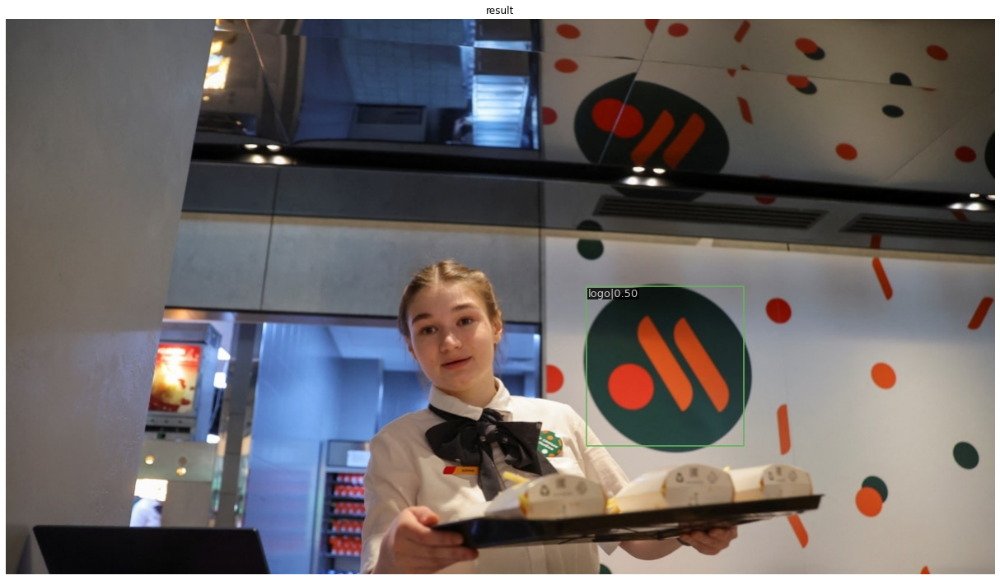

In [ ]:
img = mmcv.imread('https://gdb.rferl.org/0ff60000-0aff-0242-8654-08da4c567444_w1200_r1.jpg')
result = inference_detector(model, img)
show_result_pyplot(model, img, result)

In [ ]:
result

[array([[1.67905441e+02, 3.05868958e+02, 3.12087128e+02, 5.38266418e+02,
         2.90239722e-01],
        [2.59535858e+02, 1.25136238e+02, 3.37578644e+02, 1.69294952e+02,
         2.44417101e-01],
        [1.93165665e+02, 4.01810150e+02, 3.03284302e+02, 4.48097504e+02,
         1.57037079e-01],
        [2.82690521e+02, 1.18910484e+02, 3.20297089e+02, 1.41599731e+02,
         8.26265067e-02],
        [2.62360229e+02, 1.33226501e+02, 3.18186035e+02, 1.54889069e+02,
         4.25017364e-02],
        [2.01271698e+02, 3.02619843e+02, 2.90366028e+02, 3.54831787e+02,
         3.42405401e-02],
        [2.00606049e+02, 3.51165192e+02, 2.88241791e+02, 4.12741333e+02,
         2.20857114e-02],
        [2.64052277e+02, 1.54323715e+02, 3.14642395e+02, 1.76652939e+02,
         1.00956736e-02],
        [2.57919220e+02, 1.42067551e+02, 3.28037781e+02, 1.86017822e+02,
         7.59220030e-03],
        [8.93207458e+02, 3.28540527e+02, 9.25062500e+02, 3.48889801e+02,
         7.19877658e-03],
        [1

In [ ]:
!wget https://rr4---sn-h5qzen7l.googlevideo.com/videoplayback?expire=1658153276&ei=3BTVYuG8BobkgQef9IXYBQ&ip=185.147.214.49&id=o-AFBIadxfze8zkfOiONpdQa2Ci1GXR7YWYzzEXFzoig-A&itag=22&source=youtube&requiressl=yes&mh=SM&mm=31%2C26&mn=sn-h5qzen7l%2Csn-apn7en7l&ms=au%2Conr&mv=m&mvi=4&pl=25&initcwndbps=688750&spc=lT-Khto2B0DFQLf_28LG8nfxfQTbhWc&vprv=1&mime=video%2Fmp4&ns=LIeHcZg-cJoJO5tv5aCDbigH&ratebypass=yes&dur=695.669&lmt=1649793986327537&mt=1658131256&fvip=5&fexp=24001373%2C24007246&c=WEB&txp=4532434&n=UfOCgXMj8WUMWQ&sparams=expire%2Cei%2Cip%2Cid%2Citag%2Csource%2Crequiressl%2Cspc%2Cvprv%2Cmime%2Cns%2Cratebypass%2Cdur%2Clmt&lsparams=mh%2Cmm%2Cmn%2Cms%2Cmv%2Cmvi%2Cpl%2Cinitcwndbps&lsig=AG3C_xAwRAIgWgTF_EXsd3orLJyiH034ISaYgD2AKUXaVJZGo82T09ACIHdohz2xVgJztNtlRz2oHrEGis_dbTqgnAU0QcYuCRiv&sig=AOq0QJ8wRgIhAIwPF3WPeOzxWxGxMNhS-OpF5AFFkWql6nN2Uvdz1MokAiEAlC0xFz4Y3QE5Is82_YHvRoREief8g5o0F1jwdEOHBqI%3D&title=10%20Famous%20Funny%20Commercials

--2022-07-18 08:08:20--  https://rr4---sn-h5qzen7l.googlevideo.com/videoplayback?expire=1658153276
Resolving rr4---sn-h5qzen7l.googlevideo.com (rr4---sn-h5qzen7l.googlevideo.com)... 74.125.4.9, 2a00:1450:4003::9
Connecting to rr4---sn-h5qzen7l.googlevideo.com (rr4---sn-h5qzen7l.googlevideo.com)|74.125.4.9|:443... connected.
HTTP request sent, awaiting response... 403 Forbidden
2022-07-18 08:08:20 ERROR 403: Forbidden.



## Time test

In [ ]:
mmdet.apis.init_detector(config, checkpoint=None, device='cuda:0', cfg_options=None)  # попробовать достать nn Module

In [ ]:
import torch
import os
model.cfg = cfg

img = mmcv.imread('openlogo_coco/JPEGImages/' + os.listdir('openlogo_coco/JPEGImages')[48]) # потестить в батч режиме 

import mmcv
v = mmcv.VideoReader('/content/ads.mp4') # 11 min 30 sec 

model = model.cuda()

In [ ]:
%%time
for img in v:  
    result = inference_detector(model, img)

CPU times: user 9min 41s, sys: 5.08 s, total: 9min 46s
Wall time: 8min 27s


In [ ]:
model = model.cpu()

In [ ]:
%%time 
for img in v:  # > 48 min
    result = inference_detector(model, img)

KeyboardInterrupt: ignored